In [ ]:
# Import Data Manipulication
import pandas as pd
import numpy as np

# Import Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
# Import FilterWarnings Library
import warnings
warnings.filterwarnings('ignore')

# Import Looging Libraries
# Import Logging
import logging
logging.basicConfig(level=logging.INFO,
                    filename='model.log',
                    format='%(asctime)s:%(levelname)s - %(message)s',
                    filemode='w')
logging.info('Model Started')

# Import Scikit Learn Libraries
from sklearn.preprocessing import MinMaxScaler,StandardScaler,RobustScaler,LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error


In [ ]:
# import Dataset using Pnadas Function
df = pd.read_csv('train.csv')
df.sample(frac=1)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
188,189,90,RL,64.0,7018,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,SawyerW,Feedr,Norm,Duplex,SFoyer,5,5,1979,1979,Gable,CompShg,Plywood,Plywood,Stone,275.0,TA,TA,CBlock,Gd,TA,Av,GLQ,1086,Unf,0,0,1086,GasA,TA,Y,SBrkr,1224,0,0,1224,2,0,0,2,2,2,TA,6,Typ,2,TA,Detchd,1979.0,Unf,2,528,TA,TA,Y,120,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Alloca,153337
928,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,NaN,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,236500
296,297,50,RM,75.0,13710,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1.5Fin,5,5,1950,1950,Gable,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,TA,TA,CBlock,TA,TA,No,BLQ,420,Unf,0,490,910,GasA,TA,Y,FuseA,910,648,0,1558,0,0,1,1,4,1,TA,6,Typ,0,NaN,Attchd,1950.0,Unf,1,282,TA,TA,Y,289,0,0,0,0,0,NaN,MnPrv,NaN,0,6,2007,WD,Normal,152000
1209,1210,20,RL,85.0,10182,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,RRNn,Norm,1Fam,1Story,8,5,2006,2006,Hip,CompShg,VinylSd,VinylSd,Stone,420.0,Gd,TA,PConc,Ex,TA,Mn,GLQ,1220,Unf,0,440,1660,GasA,Ex,Y,SBrkr,1660,0,0,1660,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2006.0,RFn,2,500,TA,TA,Y,322,50,0,0,0,0,NaN,NaN,NaN,0,5,2006,New,Partial,290000
289,290,70,RL,60.0,8730,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,BrkSide,RRAn,Norm,1Fam,2Story,6,7,1915,2003,Gable,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,698,698,GasA,Ex,Y,FuseA,698,698,0,1396,0,0,1,0,3,1,TA,7,Typ,0,NaN,Detchd,2003.0,Unf,1,384,TA,TA,Y,0,0,0,0,259,0,NaN,NaN,NaN,0,7,2007,WD,Normal,153575
1154,1155,60,RL,NaN,13700,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,2Story,7,6,1965,1988,Gable,CompShg,VinylSd,VinylSd,Stone,288.0,TA,TA,CBlock,TA,TA,Gd,ALQ,454,Unf,0,410,864,GasA,TA,Y,SBrkr,902,918,0,1820,0,0,1,2,4,1,Gd,8,Typ,2,Gd,Attchd,1965.0,Unf,2,492,TA,TA,Y,60,84,0,0,273,0,NaN,GdPrv,NaN,0,5,2008,WD,Normal,201800
1163,1164,90,RL,60.0,12900,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Feedr,Norm,Duplex,SFoyer,4,4,1969,1969,Gable,CompShg,Plywood,Plywood,NaN,0.0,TA,TA,CBlock,Gd,TA,Av,GLQ,1198,Unf,0,0,1198,GasA,TA,Y,SBrkr,1258,0,0,1258,2,0,0,2,0,2,TA,6,Typ,0,NaN,CarPort,1969.0,Unf,2,400,Fa,TA,Y,120,0,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Alloca,108959
1190,1191,190,RL,NaN,32463,Pave,NaN,Reg,Low,AllPub,Inside,Mod,Mitchel,Norm,Norm,2fmCon,1Story,4,4,1961,1975,Gable,CompShg,MetalSd,MetalSd,Stone,149.0,TA,Gd,CBlock,TA,TA,Av,BLQ,1159,Unf,0,90,1249,GasA,Ex,Y,SBrkr,1622,0,0,1622,1,0,1,0,3,1,TA,7,Typ,1,TA,2Types,1975.0,Fin,4,1356,TA,TA,Y,439,0,0,0,0,0,NaN,NaN,NaN,0,3,2007,WD,Normal,168000
909,910,60,RL,149.0,12589,Pave,NaN,IR2,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,742,742,GasA,Ex,Y,SBrkr,742,742,0,1484,0,0,2,1,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,2,390,TA,TA,Y,36,24,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,174000
820,821,60,RL,72.0,7226,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf

In [ ]:
# Checking Dataset Information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [ ]:
# Checking Null Values In Dataset
ndata = df.isnull().sum()/ len(df)*100
ndata[ndata > 0].sort_values(ascending=False)

,0
PoolQC,99.520548
MiscFeature,96.301370
Alley,93.767123
Fence,80.753425
MasVnrType,59.726027
FireplaceQu,47.260274
LotFrontage,17.739726
GarageType,5.547945
GarageYrBlt,5.547945
GarageFinish,5.547945


In [ ]:
# Data Cleaning
df = df.drop(columns=['Alley','PoolQC','Fence','MiscFeature','MasVnrType','FireplaceQu','LotFrontage'], axis=1)

In [ ]:
df.shape

(1460, 74)

In [ ]:
# Segregate Numerical Coloumns and Categorical columns
numerical_col = df.select_dtypes(exclude='object')
categorical_col = df.select_dtypes(include='object')

In [ ]:
from sklearn.impute import SimpleImputer
# Imputing Numercial Columns
num_col = SimpleImputer(strategy='median')
for i in numerical_col:
    df[i] = num_col.fit_transform(df[[i]])

# Ravel(): this will helps to convert 2d to 1d :This function is same as Fallten()

# Imputing Categorical Columns
cat_col = SimpleImputer(strategy='most_frequent')
for i in categorical_col:
    df[i] = cat_col.fit_transform(df[[i]]).ravel()

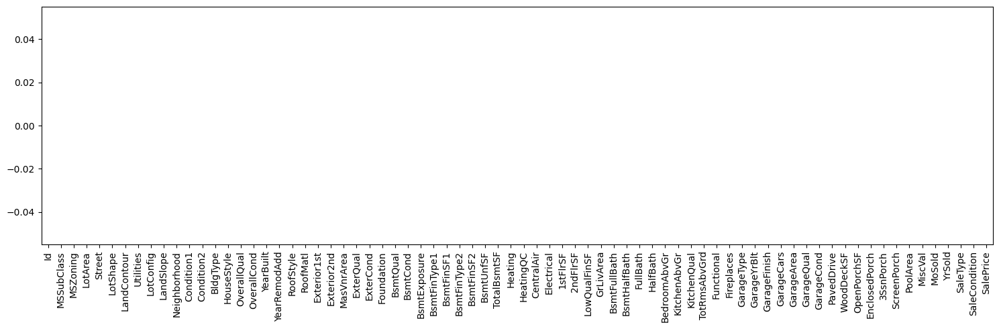

In [ ]:
plt.figure(figsize=(15,5))
df.isnull().sum().plot(kind='bar');
plt.tight_layout()


In [ ]:
#  Using LabelEncoder
le = LabelEncoder()
for i in categorical_col:
    df[i] = le.fit_transform(df[i])

In [ ]:
df

,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1.0,60.0,3,8450.0,1,3,3,0,4,0,5,2,2,0,5,7.0,5.0,2003.0,2003.0,1,1,12,13,196.0,2,4,2,2,3,3,2,706.0,5,0.0,150.0,856.0,1,0,1,4,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,2,8.0,6,0.0,1,2003.0,1,2.0,548.0,4,4,2,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,8,4,208500.0
1,2.0,20.0,3,9600.0,1,3,3,0,2,0,24,1,2,0,2,6.0,8.0,1976.0,1976.0,1,1,8,8,0.0,3,4,1,2,3,1,0,978.0,5,0.0,284.0,1262.0,1,0,1,4,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,3,6.0,6,1.0,1,1976.0,1,2.0,460.0,4,4,2,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,8,4,181500.0
2,3.0,60.0,3,11250.0,1,0,3,0,4,0,5,2,2,0,5,7.0,5.0,2001.0,2002.0,1,1,12,13,162.0,2,4,2,2,3,2,2,486.0,5,0.0,434.0,920.0,1,0,1,4,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,2,6.0,6,1.0,1,2001.0,1,2.0,608.0,4,4,2,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,8,4,223500.0
3,4.0,70.0,3,9550.0,1,0,3,0,0,0,6,2,2,0,5,7.0,5.0,1915.0,1970.0,1,1,13,15,0.0,3,4,0,3,1,3,0,216.0,5,0.0,540.0,756.0,1,2,1,4,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,2,7.0,6,1.0,5,1998.0,2,3.0,642.0,4,4,2,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0,8,0,140000.0
4,5.0,60.0,3,14260.0,1,0,3,0,2,0,15,2,2,0,5,8.0,5.0,2000.0,2000.0,1,1,12,13,350.0,2,4,2,2,3,0,2,655.0,5,0.0,490.0,1145.0,1,0,1,4,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,2,9.0,6,1.0,1,2000.0,1,3.0,836.0,4,4,2,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,8,4,250000.0
5,6.0,50.0,3,14115.0,1,0,3,0,4,0,11,2,2,0,0,5.0,5.0,1993.0,1995.0,1,1,12,13,0.0,3,4,5,2,3,3,2,732.0,5,0.0,64.0,796.0,1,0,1,4,796.0,566.0,0.0,1362.0,1.0,0.0,1.0,1.0,1.0,1.0,3,5.0,6,0.0,1,1993.0,2,2.0,480.0,4,4,2,40.0,30.0,0.0,320.0,0.0,0.0,700.0,10.0,2009.0,8,4,143000.0
6,7.0,20.0,3,10084.0,1,3,3,0,4,0,21,2,2,0,2,8.0,5.0,2004.0,2005.0,1,1,12,13,186.0,2,4,2,0,3,0,2,1369.0,5,0.0,317.0,1686.0,1,0,1,4,1694.0,0.0,0.0,1694.0,1.0,0.0,2.0,0.0,3.0,1.0,2,7.0,6,1.0,1,2004.0,1,2.0,636.0,4,4,2,255.0,57.0,0.0,0.0,0.0,0.0,0.0,8.0,2007.0,8,4,307000.0
7,8.0,60.0,3,10382.0,1,0,3,0,0,0,14,4,2,0,5,7.0,6.0,1973.0,1973.0,1,1,6,6,240.0,3,4,1,2,3,2,0,859.0,1,32.0,216.0,1107.0,1,0,1,4,1107.0,983.0,0.0,2090.0,1.0,0.0,2.0,1.0,3.0,1.0,3,7.0,6,2.0,1,1973.0,1,2.0,484.0,4,4,2,235.0,204.0,228.0,0.0,0.0,0.0,350.0,11.0,2009.0,8,4,200000.0
8,9.0,50.0,4,6120.0,1,3,3,0,4,0,17,0,2,0,0,7.0,5.0,1931.0,1950.0,1,1,3,15,0.0,3,4,0,3,3,3,5,0.0,5,0.0,952.0,952.0,1,2,1,1,1022.0,752.0,0.0,1774.0,0.0,0.0,2.0,0.0,2.0,2.0,3,8.0,2,2.0,5,1931.0,2,2.0,468.0,1,4,2,90.0,0.0,205.0,0.0,0.0,0.0,0.0,4.0,2008.0,8,0,129900.0
9,10.0,190.0,3,7420.0,1,3,3,0,0,0,3,0,0,1,1,5.0,6.0,1939.0,1950.0,1,1,8,8,0.0,3,4,0,3,3,3,2,851.0,5,0.0,140.0,991.0,1,0,1,4,1077.0,0.0,0.0,1077.0,1.0,0.0,1.0,0.0,2.0,2.0,3,5.0,6,2.0,1,1939.0,1,1.0,205.0,2,4,2,0.0,4.0,0.0,0.0,0.0,0.0,0.0,1.0,2008.0,8,4,118000.0


In [ ]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)


# EDA:UNIVERAITE Analysis
from collections import OrderedDict
stats = []
for i in df.columns:
    numercial_stats = OrderedDict({
        'Feature':i,
        'Count':df[i].count(),
        'Minimum :':df[i].min(),
        'Maximum':df[i].max(),
        'Mean':df[i].mean(),
        'Median':df[i].median(),
        'Q1':df[i].quantile(0.25),
        'Q3':df[i].quantile(0.75),
        'IQR':df[i].quantile(0.75)-df[i].quantile(0.25),
        'Std':df[i].std(),
        'Skewness':df[i].skew(),
        'Kurtosis':df[i].kurt(),


    })
    stats.append(numercial_stats)
    report = pd.DataFrame(stats)

report



,Feature,Count,Minimum :,Maximum,Mean,Median,Q1,Q3,IQR,Std,Skewness,Kurtosis
0,Id,1460,1.0,1460.0,730.500000,730.5,365.75,1095.25,729.50,421.610009,0.000000,-1.200000
1,MSSubClass,1460,20.0,190.0,56.897260,50.0,20.00,70.00,50.00,42.300571,1.407657,1.580188
2,MSZoning,1460,0.0,4.0,3.028767,3.0,3.00,3.00,0.00,0.632017,-1.735395,6.287175
3,LotArea,1460,1300.0,215245.0,10516.828082,9478.5,7553.50,11601.50,4048.00,9981.264932,12.207688,203.243271
4,Street,1460,0.0,1.0,0.995890,1.0,1.00,1.00,0.00,0.063996,-15.518770,239.159822
5,LotShape,1460,0.0,3.0,1.942466,3.0,0.00,3.00,3.00,1.409156,-0.610175,-1.595908
6,LandContour,1460,0.0,3.0,2.777397,3.0,3.00,3.00,0.00,0.707666,-3.162499,8.695631
7,Utilities,1460,0.0,1.0,0.000685,0.0,0.00,0.00,0.00,0.026171,38.209946,1460.000000
8,LotConfig,1460,0.0,4.0,3.019178,4.0,2.00,4.00,2.00,1.622634,-1.135632,-0.579872
9,LandSlope,1460,0.0,2.0,0.062329,0.0,0.00,0.00,0.00,0.276232,4.813682,24.597605


In [ ]:
report[report['IQR']== 0]['Feature'].values

array(['MSZoning', 'Street', 'LandContour', 'Utilities', 'LandSlope',
       'Condition1', 'Condition2', 'BldgType', 'RoofStyle', 'RoofMatl',
       'ExterCond', 'BsmtCond', 'BsmtFinType2', 'BsmtFinSF2', 'Heating',
       'CentralAir', 'Electrical', 'LowQualFinSF', 'BsmtHalfBath',
       'KitchenAbvGr', 'Functional', 'GarageQual', 'GarageCond',
       'PavedDrive', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch',
       'PoolArea', 'MiscVal', 'SaleType', 'SaleCondition'], dtype=object)

In [ ]:
# Data Claeaning
df.drop(columns=['MSZoning', 'Street', 'LandContour', 'Utilities', 'LandSlope',
       'Condition1', 'Condition2', 'BldgType', 'RoofStyle', 'RoofMatl',
       'ExterCond', 'BsmtCond', 'BsmtFinType2', 'BsmtFinSF2', 'Heating',
       'CentralAir', 'Electrical', 'LowQualFinSF', 'BsmtHalfBath',
       'KitchenAbvGr', 'Functional', 'GarageQual', 'GarageCond',
       'PavedDrive', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch',
       'PoolArea', 'MiscVal', 'SaleType', 'SaleCondition'],inplace = True)


In [ ]:
df.shape

(1460, 43)

In [ ]:
df.columns

Index(['Id', 'MSSubClass', 'LotArea', 'LotShape', 'LotConfig', 'Neighborhood',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'Exterior1st', 'Exterior2nd', 'MasVnrArea', 'ExterQual', 'Foundation',
       'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtUnfSF',
       'TotalBsmtSF', 'HeatingQC', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

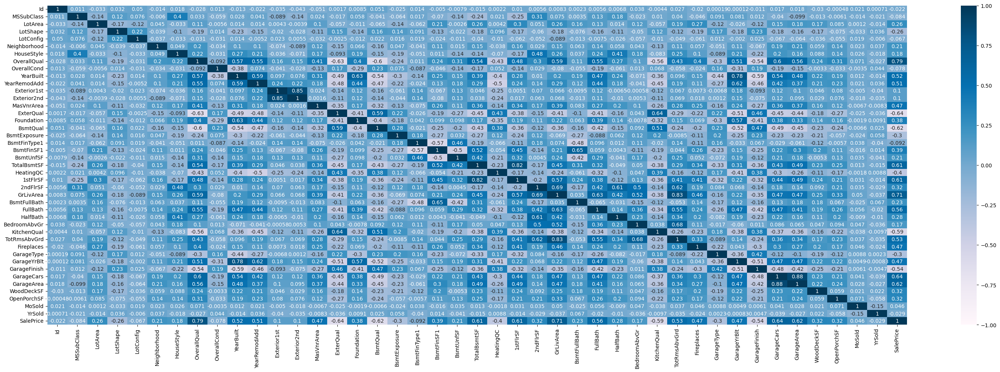

In [ ]:
# HeatMap
plt.figure(figsize=(30,10))
sns.heatmap(df.corr(),annot=True,vmin=-1,vmax=1,center = 0 ,cmap='PuBu')
plt.tight_layout()
plt.show()

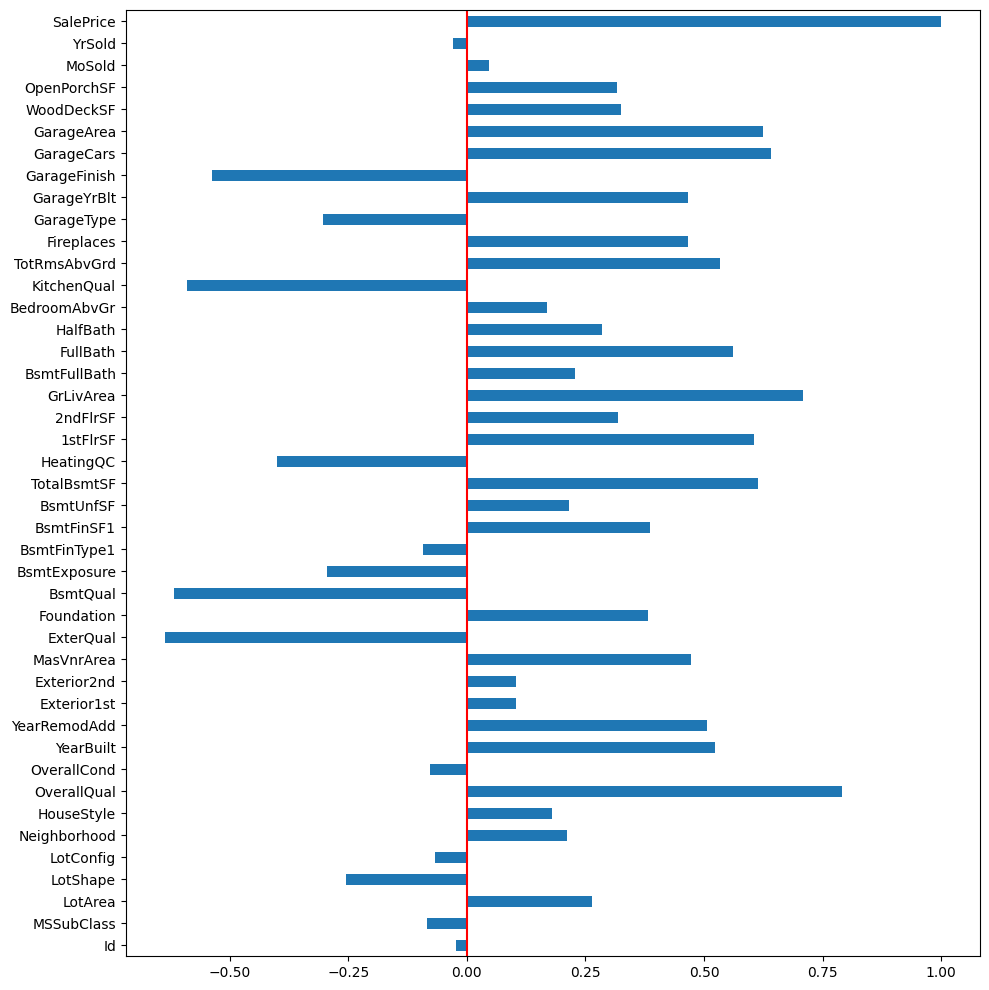

In [ ]:
plt.figure(figsize=(10,10))
df.corr()['SalePrice'].plot(kind = 'barh')
plt.axvline(0,color='red')
plt.tight_layout()
plt.show()

In [ ]:
X = df.drop(columns = ['Id','SalePrice'],axis=1)
y = df['SalePrice']


In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.30,random_state=42)

In [ ]:
sc = MinMaxScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train,y_train)
y_pred_rf = rf.predict(X_test)
r2_score(y_test,y_pred_rf)

0.9037713228738978

In [ ]:
!pip install xgboost

In [ ]:
! pip install catboost

In [ ]:
from catboost import CatBoostRegressor



In [ ]:
from xgboost import XGBRegressor
xgb = XGBRegressor()
xgb.fit(X_train,y_train)
y_pred_xgb = xgb.predict(X_test)
r2_score(y_test,y_pred_xgb)

0.9159931437821895

In [ ]:
from catboost import CatBoostRegressor
cat = CatBoostRegressor()
cat.fit(X_train,y_train)
y_pred_cat = cat.predict(X_test)
r2_score(y_test,y_pred_cat)

Learning rate set to 0.04196
0:	learn: 75124.9205065	total: 4.69ms	remaining: 4.68s
1:	learn: 73207.1385450	total: 8.16ms	remaining: 4.07s
2:	learn: 71229.5789257	total: 11.4ms	remaining: 3.79s
3:	learn: 69403.0595585	total: 14.7ms	remaining: 3.67s
4:	learn: 67665.2899068	total: 18.2ms	remaining: 3.62s
5:	learn: 65967.7524269	total: 21.6ms	remaining: 3.58s
6:	learn: 64408.9233820	total: 24.9ms	remaining: 3.53s
7:	learn: 62818.0274158	total: 28.4ms	remaining: 3.52s
8:	learn: 61324.6675817	total: 31.6ms	remaining: 3.48s
9:	learn: 59927.1074304	total: 35ms	remaining: 3.47s
10:	learn: 58489.3703013	total: 38.4ms	remaining: 3.45s
11:	learn: 57150.7140023	total: 42ms	remaining: 3.46s
12:	learn: 55939.9633912	total: 45.4ms	remaining: 3.45s
13:	learn: 54746.5037154	total: 48.9ms	remaining: 3.44s
14:	learn: 53581.9998061	total: 59.2ms	remaining: 3.88s
15:	learn: 52393.1038167	total: 69.4ms	remaining: 4.27s
16:	learn: 51231.5152131	total: 82.4ms	remaining: 4.77s
17:	learn: 50311.8314382	total: 8

0.9086222794552913

In [ ]:
rf.feature_importances_

array([0.00326413, 0.01796001, 0.00159154, 0.00116348, 0.01134015,
       0.00065621, 0.52542871, 0.00457266, 0.01373888, 0.00938027,
       0.0019283 , 0.00286729, 0.00461013, 0.00326179, 0.0007858 ,
       0.01562712, 0.00257016, 0.00185984, 0.02760134, 0.00700807,
       0.03722947, 0.00120661, 0.03114419, 0.03109885, 0.13641222,
       0.00104846, 0.00311778, 0.00064349, 0.00202659, 0.00488467,
       0.00723095, 0.00408854, 0.00290663, 0.00697685, 0.01057831,
       0.02154289, 0.01968899, 0.00743494, 0.00769431, 0.00379031,
       0.00203907])

In [ ]:
rf.feature_importances_.max()

np.float64(0.5254287105009994)

In [ ]:
# y = mx + c

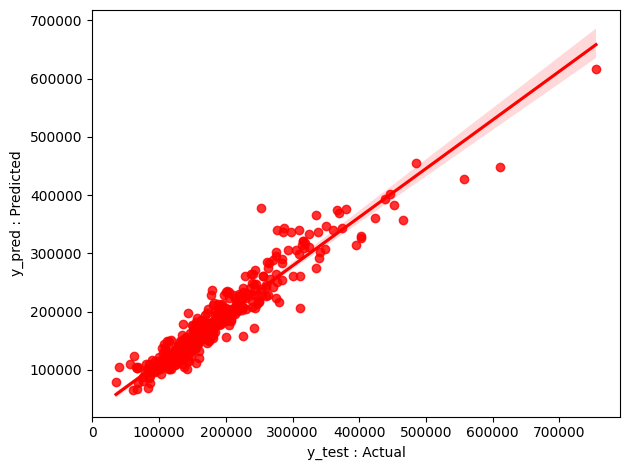

In [ ]:
sns.regplot(x=y_test,y=y_pred_rf, color='red')
plt.xlabel('y_test : Actual')
plt.ylabel('y_pred : Predicted')
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=41)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train_pca,y_train)
y_pred_rf = rf.predict(X_test_pca)
r2_score(y_test,y_pred_rf)

0.8139674399331249